In [85]:
import matplotlib.patches as patches
import matplotlib.colors as mcolors
import matplotlib.animation as ma
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from itertools import product
import pandas as pd
import numpy as np
import numba as nb
import imageio
import json
import os
import shutil
import sys
sys.path.append("..")

from PJT_Frustration_Induced_Crystallize.main import *

randomSeed = 100

%matplotlib inline
%config InlineBackend.figure_format = "retina"

new_cmap = mcolors.LinearSegmentedColormap.from_list(
    "new", plt.cm.hsv(np.linspace(0, 1, 256)) * 0.85, N=256
)

@nb.njit
def colors_idx(phaseTheta):
    return np.floor(256 - phaseTheta / (2 * np.pi) * 256).astype(np.int32)

with open("../swarmalatorlib/hex_colors.json", "r", encoding="utf-8") as f:
    hexColors = json.load(f)
hexCmap = mcolors.LinearSegmentedColormap.from_list("cmap", hexColors)


import seaborn as sns

sns.set_theme(
    style="ticks", 
    font_scale=1.1, rc={
    'figure.figsize': (6, 5),
    'axes.facecolor': 'white',
    'figure.facecolor': 'white',
    'grid.color': '#dddddd',
    'grid.linewidth': 0.5,
    "lines.linewidth": 1.5,
    'text.color': '#000000',
    'figure.titleweight': "bold",
    'xtick.color': '#000000',
    'ytick.color': '#000000'
})

plt.rcParams['mathtext.fontset'] = 'cm'
plt.rcParams['font.family'] = 'STIXGeneral'
#plt.rcParams['animation.ffmpeg_path'] = "/opt/conda/bin/ffmpeg"

from multiprocessing import Pool
import pandas as pd

colors = ["#403990", "#3A76D6", "#FFC001", "#F46F43", "#FF0000"]
cmap = mcolors.LinearSegmentedColormap.from_list("cmap", colors)
cmap_r = mcolors.LinearSegmentedColormap.from_list("my_colormap", colors[::-1])

colors = ["#403990", "#80A6E2", "#F46F43", "#CF3D3E"]
cmap2 = mcolors.LinearSegmentedColormap.from_list("cmap2", colors)

SAVE_PATH = r"F:\MS_ExperimentData\general"
MP4_PATH = r"F:\MS_ExperimentData\mp4"

# SAVE_PATH = r"D:\MS_ExperimentData\general"
# MP4_PATH = r"D:\MS_ExperimentData\mp4"

# LOCAL_FIG_PATH = "./PCT_C_figs"
LOCAL_FIG_PATH = "./figs"

In [ ]:
phaseLags = [0.6 * np.pi]
omegaMins = [0]  # np.linspace(1e-5, 3, 21)
randomSeed = 10
strengthKs = np.linspace(4, 20, 19)
distanceD0s = np.linspace(0.3, 1.1, 19)  
deltaOmegas = [0]  # np.linspace(1e-5, 3, 21)  # [1.0]

models = [
    PhaseLagPatternFormation(
        strengthK=strengthK, distanceD0=distanceD0, phaseLagA0=phaseLag,
        freqDist="uniform", initPhaseTheta=None,
        omegaMin=omegaMin, deltaOmega=deltaOmega, 
        agentsNum=2000, dt=0.005,
        tqdm=True, savePath=SAVE_PATH, shotsnaps=10, 
        randomSeed=randomSeed, overWrite=False
    )
    for strengthK in strengthKs
    for distanceD0 in distanceD0s
    for omegaMin in omegaMins
    for deltaOmega in deltaOmegas
    for phaseLag in phaseLags
]

In [26]:
phaseLags = [0.6 * np.pi]
omegaMins = [0]  # np.linspace(1e-5, 3, 21)
randomSeed = 10 
strengthKs = np.linspace(1, 20, 19)
distanceD0s = np.linspace(0.1, 3, 19)  
deltaOmegas = [0]  # np.linspace(1e-5, 3, 21)  # [1.0]
models = [
    PhaseLagPatternFormation(
        strengthK=strengthK, distanceD0=distanceD0, phaseLagA0=phaseLag,
        freqDist="uniform", initPhaseTheta=None,
        omegaMin=omegaMin, deltaOmega=deltaOmega, 
        agentsNum=2000, dt=0.005,
        tqdm=True, savePath=SAVE_PATH, shotsnaps=10, 
        randomSeed=randomSeed, overWrite=False
    )
    for strengthK in strengthKs
    for distanceD0 in distanceD0s
    for omegaMin in omegaMins
    for deltaOmega in deltaOmegas
    for phaseLag in phaseLags
]

In [4]:
savePath = (
    f"last_state/{models[0].__class__.__name__}_"
    f"{models[0].freqDist}_"
    f"omegaMin{models[0].omegaMin:.3f}_deltaOmega{models[0].deltaOmega:.3f}_"
    f"phaseLagA0{models[0].phaseLagA0:.3f}_"
    f"Ks{strengthKs[0]:.3f}-{strengthKs[-1]:.3f}_"
    f"D0s{distanceD0s[0]:.3f}-{distanceD0s[-1]:.3f}_"  
    f"lastState.h5"
)
modelsNum = len(models)

sas = list()
allPositionX = pd.read_hdf(savePath, key="positionX")
allPhaseTheta = pd.read_hdf(savePath, key="phaseTheta")
allPositionX = allPositionX.values.reshape(modelsNum, models[0].agentsNum, 2)
allPhaseTheta = allPhaseTheta.values.reshape(modelsNum, models[0].agentsNum)

for i, model in enumerate(models):
    sa = StateAnalysis()
    sa.model = model
    sa.totalPositionX = np.array([allPositionX[i]])
    sa.totalPhaseTheta = np.array([allPhaseTheta[i]])
    sas.append(sa)

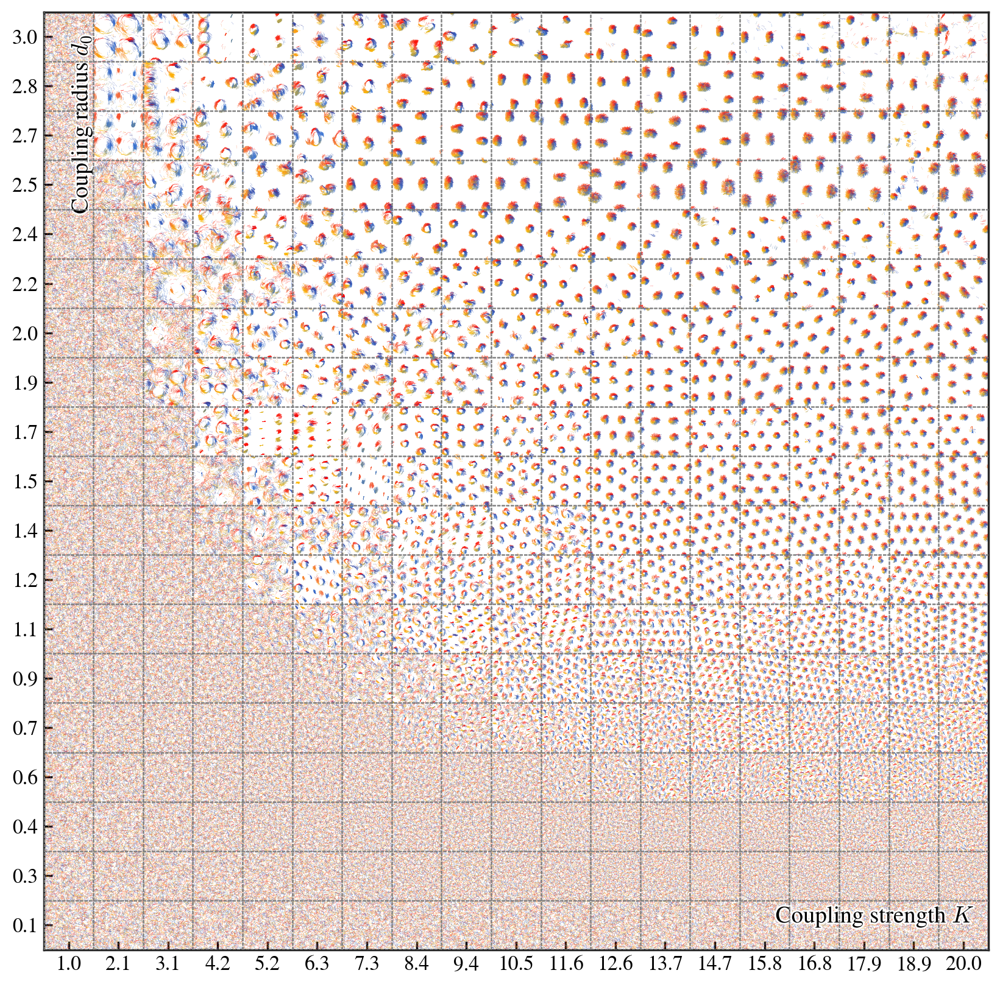

In [6]:
from matplotlib.patheffects import withStroke

colParams = distanceD0s
rowParams = strengthKs
colorsBy = "phase"

# fig, ax = plt.subplots(figsize=(len(rowParams) * 4, len(colParams) * 4))
fig, ax = plt.subplots(figsize=(10, 10))

for i, sa in enumerate(sas):
    if sa is None:
        continue
    row = i // len(rowParams)
    col = i % len(rowParams)
    
    positionShift = np.array([row, col]) * sa.model.boundaryLength
    positionX, phaseTheta = sa.get_state(-1)
    positionX = positionX + positionShift
    if colorsBy == "freq":
        colors = (
            ["red"] * (sa.model.freqOmega >= 0).sum() + 
            ["#414CC7"] * (sa.model.freqOmega < 0).sum()
        )
    elif colorsBy == "phase":
        colors = [cmap(i) for i in
            np.floor(256 - phaseTheta / (2 * np.pi) * 256).astype(np.int32)
        ]

    ax.quiver(
        positionX[:, 0], positionX[:, 1],
        np.cos(phaseTheta), np.sin(phaseTheta), 
        color=colors,
        scale=300, width=0.0004 / len(rowParams) * 7
    )
    ax.axhline(
        y=col * sa.model.boundaryLength, 
        color="gray", linewidth=0.5, linestyle="--", alpha=0.3, zorder=100
    )
    ax.axvline(
        x=row * sa.model.boundaryLength, 
        color="gray", linewidth=0.5, linestyle="--", alpha=0.3, zorder=100
    )

boundaryLength = models[0].boundaryLength
plt.xlim(0, len(rowParams) * boundaryLength)
plt.ylim(0, len(colParams) * boundaryLength)
plt.xticks(
    np.arange(0, len(rowParams) * boundaryLength, boundaryLength) + boundaryLength / 2,
    [f"{k:.1f}" for k in rowParams]
)
plt.yticks(
    np.arange(0, len(colParams) * boundaryLength, boundaryLength) + boundaryLength / 2,
    [f"{d:.1f}" for d in colParams]
)

text1 = plt.text(len(rowParams) * boundaryLength * 0.88, len(rowParams) * boundaryLength * 0.035,
                 "Coupling strength $K$", # weight="bold",
                 fontsize=14, ha="center", va="center")
text2 = plt.text(len(rowParams) * boundaryLength * 0.04, len(rowParams) * boundaryLength * 0.88,
                 "Coupling radius $d_0$", # weight="bold",
                 fontsize=14, ha="center", va="center", rotation=90)
for text in [text1, text2]:
    text.set_path_effects([withStroke(linewidth=2, foreground='white')])
plt.tick_params(length=5, direction="in")
# plt.savefig(
#     f"figs/{sa.model.__class__.__name__}_"
#     f"varying_strengthK_and_distanceD0_{colorsBy}_"
#     f"a{phaseLags[0]:.2f}_Do{deltaOmegas[0]}"
#     f"{'initPhaseTheta,' if sa.model.initPhaseTheta is not None else ''}"
#     f"_aN{sa.model.agentsNum}_dist{sa.model.freqDist}.pdf", 
#     bbox_inches="tight"
# )

  0%|          | 0/361 [00:00<?, ?it/s]

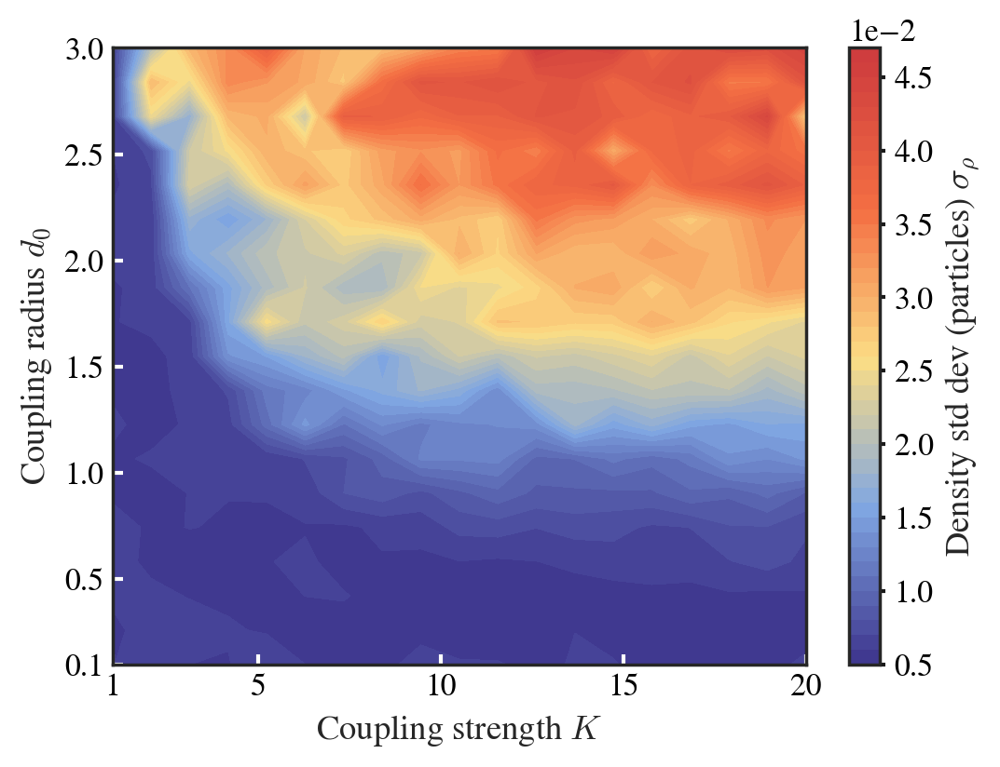

In [99]:
cellNumInLine = 8

opMap = pd.DataFrame(index=distanceD0s, columns=strengthKs, dtype=np.float64)
tailTimeCounts = 1

for sa in tqdm(sas):

    sa: StateAnalysis
    dx = sa.model.boundaryLength / (cellNumInLine - 1)
    ops = list()

    for t in np.arange(-tailTimeCounts, 0):

        positionX, _ = sa.get_state(t)
        ocsiIdx = (positionX / dx).round().astype(np.int32)
        localCounts = np.zeros((cellNumInLine, cellNumInLine), dtype=np.float64)
        for idx in ocsiIdx:
            localCounts[idx[0], idx[1]] += 1
        particalDensity = localCounts / localCounts.sum() #* sa.model.agentsNum

        op = np.std(particalDensity.flatten())
        ops.append(op)

    opMap.loc[sa.model.distanceD0, sa.model.strengthK] = np.mean(ops)

plt.figure(figsize=(6, 4.3))
dx = (opMap.columns.max() - opMap.columns.min()) / (len(opMap.columns) - 1)
dy = (opMap.index.max() - opMap.index.min()) / (len(opMap.index) - 1)
extent = [
    opMap.columns.min() - dx/2, opMap.columns.max() + dx/2,
    opMap.index.min() - dy/2, opMap.index.max() + dy/2
]
colors = ["#403990", "#80A6E2", "#FBDD85", "#F46F43", "#CF3D3E"]
ccmap = mcolors.LinearSegmentedColormap.from_list("my_colormap", colors)
plt.contourf(
    opMap, 
    cmap=ccmap,
    vmin=opMap.values.min(), vmax=opMap.values.max(),
    extent=extent,
    origin="lower", zorder=0,
    # aspect='auto',
    levels=40, 
)
# plt.pcolormesh(
#     opMap.columns, opMap.index, opMap.values,
#     cmap=cmap,
#     vmin=opMap.values.min(), vmax=opMap.values.max(),
#     shading='auto'  # 或 'nearest', 'gouraud'
# )
cb = plt.colorbar(label=r"Density std dev (particles) $\sigma_{\rho}$")
cb.ax.tick_params(length=2, direction="out", color="k", width=1.5)
cb.formatter.set_powerlimits((0, 0))
cb.ax.yaxis.set_offset_position('left')
cb.update_ticks()
cb.ax.set_zorder(3)
for line in cb.ax.yaxis.get_ticklines():
    line.set_zorder(4)
plt.xlabel("Coupling strength $K$")
plt.ylabel("Coupling radius $d_0$")

x_min, x_max = opMap.columns.min(), opMap.columns.max()
y_min, y_max = opMap.index.min(), opMap.index.max()

plt.xticks([1, 5, 10, 15, 20])
plt.yticks([0.1, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0])

plt.tick_params(length=4, direction="in", color="white", width=1.5)
# plt.savefig("figs/orderParameter_varying_strengthK_and_distanceD0.png", 
#             bbox_inches="tight", dpi=150)

In [3]:
from scipy.special import j1

def theta_k(k, d0):
    if isinstance(k, (list, np.ndarray)):
        k_norm = np.linalg.norm(k)
    else:
        k_norm = k
        
    if k_norm == 0:
        return np.pi * d0**2
    else:
        return (2 * np.pi * d0 / k_norm) * j1(k_norm * d0)

def lambda_m(k: float | List | np.ndarray, d0: float, K: float, alpha: float):
    theta0 = theta_k(0, d0)
    thetaK = theta_k(k, d0)
    return K * thetaK / (theta0 * 2) * np.cos(alpha)

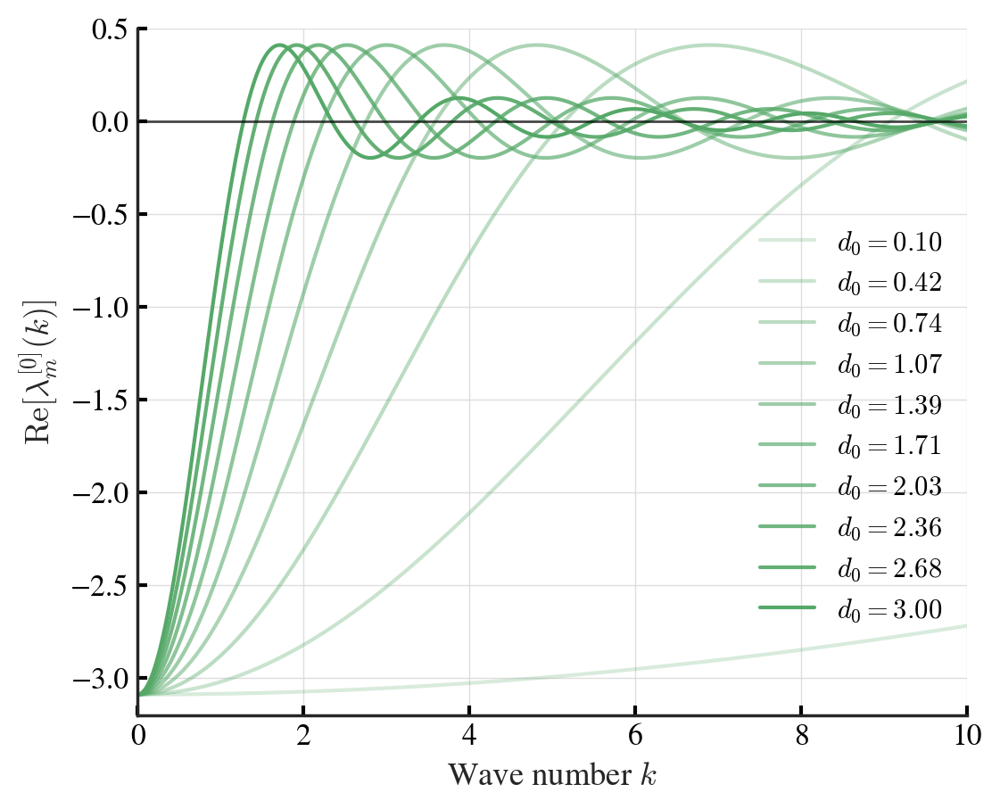

In [20]:
distanceD0s = np.linspace(0.1, 3, 10)

for d0 in distanceD0s:

    kNorms = np.linspace(0., 10, 1000)
    lambda_ms = np.array([
        lambda_m(kNorm, d0=d0, K=20, alpha=0.6 * np.pi) 
        for kNorm in kNorms
    ])
    alphaBase = 0.2
    alpha = alphaBase + (d0 / distanceD0s[-1]) * (1 - alphaBase)
    plt.plot(kNorms, lambda_ms, label=f"$d_0={d0:.2f}$", color="C2", alpha=alpha)

plt.axhline(y=0, color="black", linestyle="-", linewidth=1, alpha=0.7, zorder=100)
plt.legend(fontsize=11, frameon=False, loc="center right", bbox_to_anchor=(1, 0.42))
plt.xlabel("Wave number $k$")
plt.ylabel(r"$\mathrm{Re}[\lambda_m^{[0]}(k)]$")
plt.tick_params(length=4, direction="in", color="black", width=1.5)
plt.xlim(0, 10)
plt.ylim(-3.2, 0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.grid()
plt.savefig("figs/phaseLagPatternFormation_lambda_m.pdf", bbox_inches="tight")

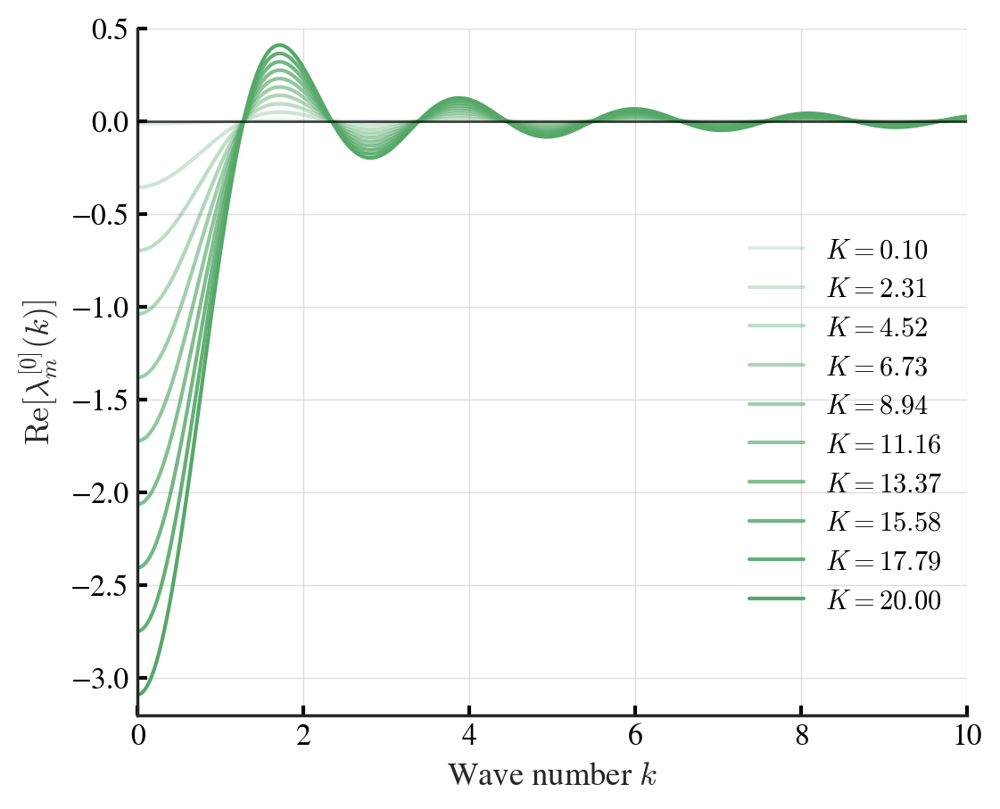

In [29]:
Ks = np.linspace(0.1, 20, 10)

for K in Ks:

    kNorms = np.linspace(0., 10, 1000)
    lambda_ms = np.array([
        lambda_m(kNorm, d0=3, K=K, alpha=0.6 * np.pi) 
        for kNorm in kNorms
    ])
    alphaBase = 0.2
    alpha = alphaBase + (K / Ks[-1]) * (1 - alphaBase)
    plt.plot(kNorms, lambda_ms, label=f"$K={K:.2f}$", color="C2", alpha=alpha)

plt.axhline(y=0, color="black", linestyle="-", linewidth=1, alpha=0.7, zorder=100)
plt.legend(fontsize=11, frameon=False, loc="center right", bbox_to_anchor=(1, 0.42))
plt.xlabel("Wave number $k$")
plt.ylabel(r"$\mathrm{Re}[\lambda_m^{[0]}(k)]$")
plt.tick_params(length=4, direction="in", color="black", width=1.5)
plt.xlim(0, 10)
plt.ylim(-3.2, 0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.grid()
plt.savefig("figs/phaseLagPatternFormation_lambda_m_varyK.pdf", bbox_inches="tight")

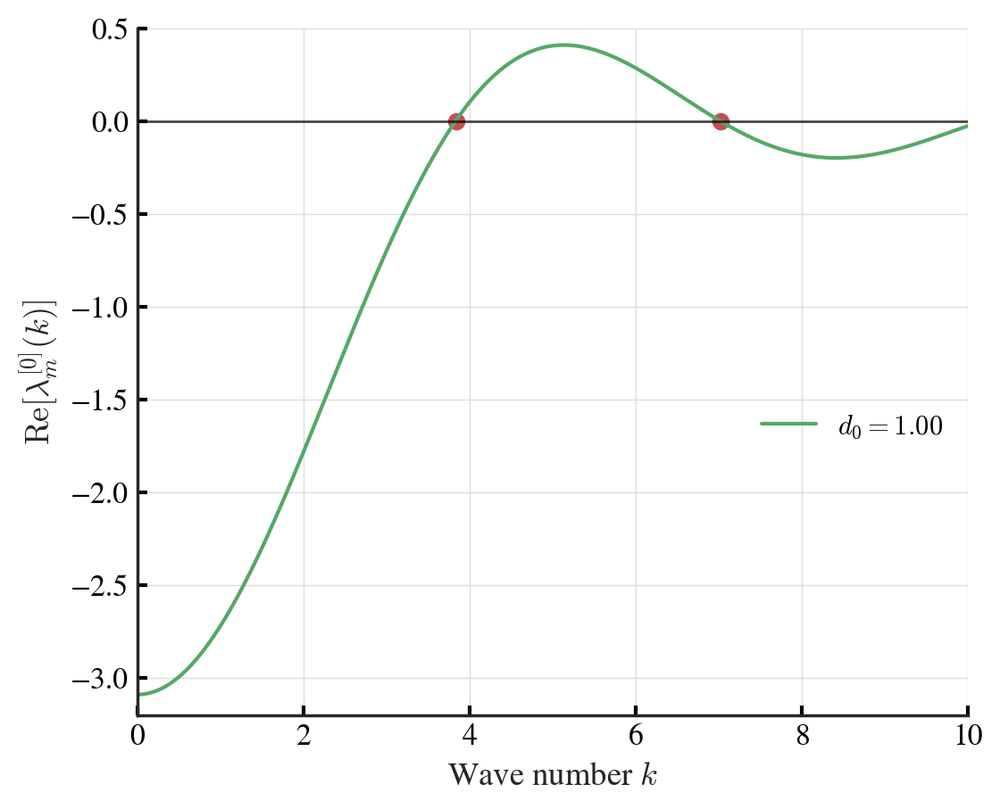

In [18]:
distanceD0s = [1]

for d0 in distanceD0s:

    kNorms = np.linspace(0., 100, 10000)
    lambda_ms = np.array([
        lambda_m(kNorm, d0=d0, K=20, alpha=0.6 * np.pi) 
        for kNorm in kNorms
    ])
    alphaBase = 0.2
    alpha = alphaBase + (d0 / distanceD0s[-1]) * (1 - alphaBase)
    plt.plot(kNorms, lambda_ms, label=f"$d_0={d0:.2f}$", color="C2", alpha=alpha)
    zeroPoint = kNorms[(np.roll(lambda_ms, 1) * lambda_ms < 0) & (kNorms > 0)]
    plt.scatter(zeroPoint, np.zeros_like(zeroPoint), color="C3")

plt.axhline(y=0, color="black", linestyle="-", linewidth=1, alpha=0.7, zorder=100)
plt.legend(fontsize=11, frameon=False, loc="center right", bbox_to_anchor=(1, 0.42))
plt.xlabel("Wave number $k$")
plt.ylabel(r"$\mathrm{Re}[\lambda_m^{[0]}(k)]$")
plt.tick_params(length=4, direction="in", color="black", width=1.5)
plt.xlim(0, 10)
plt.ylim(-3.2, 0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.grid()
# plt.savefig("figs/phaseLagPatternFormation_lambda_m_zeroPoint.pdf", bbox_inches="tight")

In [14]:
np.diff(zeroPoint)

array([1.06106106, 1.05105105, 1.05105105, 1.05105105, 1.05105105,
       1.04104104, 1.05105105, 1.05105105])

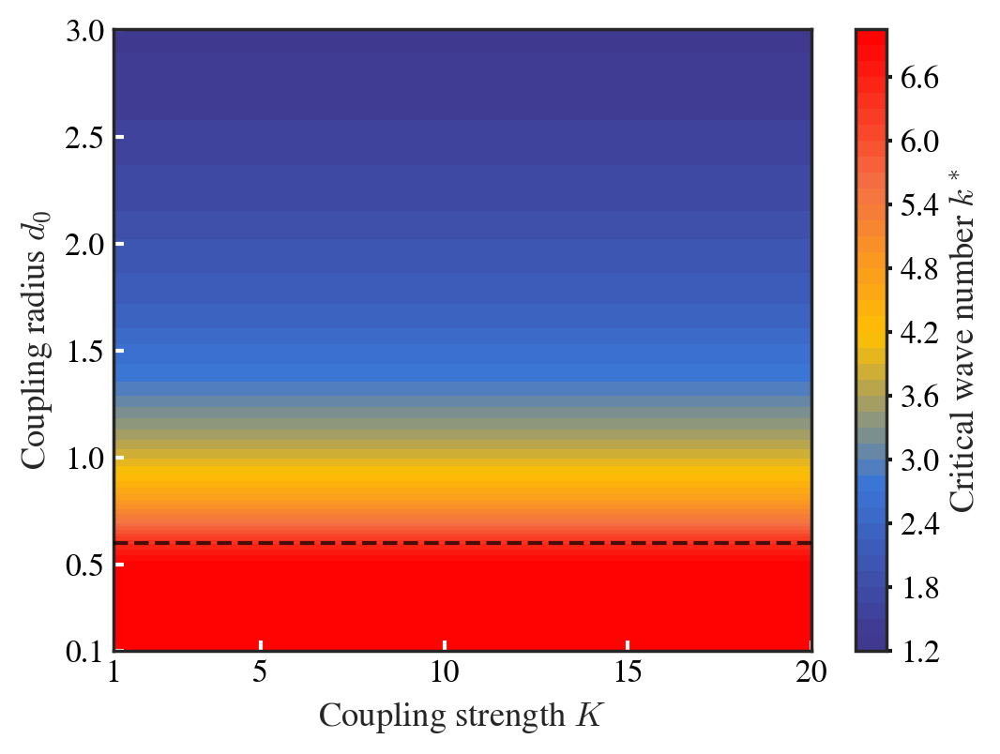

In [28]:
distanceD0s = np.linspace(0.1, 3, 30)
strengthKs = np.linspace(1, 20, 30)
opMap = pd.DataFrame(index=distanceD0s, columns=strengthKs, dtype=np.float64)
maxKNorm = 7

for d0, K in product(distanceD0s, strengthKs):

    kNorms = np.linspace(0, maxKNorm, 100)
    lambda_ms = np.array([
        lambda_m(kNorm, d0=d0, K=K, alpha=0.6 * np.pi) 
        for kNorm in kNorms
    ])
    
    if np.all(lambda_ms <= 0):
        opMap.loc[d0, K] = maxKNorm
        continue

    firstBreakKNorm = kNorms[np.where(lambda_ms > 0)[0][0]]
    opMap.loc[d0, K] = firstBreakKNorm

plt.figure(figsize=(6, 4.3))
dx = (opMap.columns.max() - opMap.columns.min()) / (len(opMap.columns) - 1)
dy = (opMap.index.max() - opMap.index.min()) / (len(opMap.index) - 1)
extent = [
    opMap.columns.min() - dx/2, opMap.columns.max() + dx/2,
    opMap.index.min() - dy/2, opMap.index.max() + dy/2
]
# colors = ["#403990", "#80A6E2", "#FBDD85", "#F46F43", "#CF3D3E"]
# ccmap = mcolors.LinearSegmentedColormap.from_list("my_colormap", colors)
plt.contourf(
    opMap, 
    cmap=cmap,
    vmin=opMap.values.min(), vmax=opMap.values.max(),
    extent=extent,
    origin="lower", zorder=0,
    # aspect='auto',
    levels=40, 
)
# plt.pcolormesh(
#     opMap.columns, opMap.index, opMap.values,
#     cmap=cmap,
#     vmin=opMap.values.min(), vmax=opMap.values.max(),
#     shading='auto'  # 或 'nearest', 'gouraud'
# )
cb = plt.colorbar(label=r"Critical wave number $k^*$")
cb.ax.tick_params(length=2, direction="out", color="k", width=1.5)
cb.formatter.set_powerlimits((0, 0))
cb.ax.yaxis.set_offset_position('left')
cb.update_ticks()
cb.ax.set_zorder(3)
for line in cb.ax.yaxis.get_ticklines():
    line.set_zorder(4)

criticalD0 = opMap[strengthKs[-1]][opMap[strengthKs[-1]] < maxKNorm].index[0]
plt.axhline(y=criticalD0, color="black", linestyle="--", linewidth=1.5, alpha=0.7, zorder=100)

plt.xlabel("Coupling strength $K$")
plt.ylabel("Coupling radius $d_0$")

x_min, x_max = opMap.columns.min(), opMap.columns.max()
y_min, y_max = opMap.index.min(), opMap.index.max()

plt.xticks([1, 5, 10, 15, 20])
plt.yticks([0.1, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0])

plt.tick_params(length=4, direction="in", color="white", width=1.5)
plt.savefig("figs/orderParameter_Kstar_varying_strengthK_and_distanceD0.png", 
            bbox_inches="tight", dpi=150)

In [62]:
phaseLags = [0.6 * np.pi]
omegaMins = [0]  # np.linspace(1e-5, 3, 21)
randomSeed = 10 
strengthKs = np.linspace(1, 20, 19)
distanceD0s = np.linspace(0.1, 3, 19)  
deltaOmegas = [0]  # np.linspace(1e-5, 3, 21)  # [1.0]
models = [
    PhaseLagPatternFormation(
        strengthK=strengthK, distanceD0=distanceD0, phaseLagA0=phaseLag,
        freqDist="uniform", initPhaseTheta=None,
        omegaMin=omegaMin, deltaOmega=deltaOmega, 
        agentsNum=2000, dt=0.005,
        tqdm=True, savePath=SAVE_PATH, shotsnaps=10, 
        randomSeed=randomSeed, overWrite=False
    )
    for strengthK in strengthKs
    for distanceD0 in distanceD0s
    for omegaMin in omegaMins
    for deltaOmega in deltaOmegas
    for phaseLag in phaseLags
]

In [63]:
savePath = (
    f"last_state/{models[0].__class__.__name__}_"
    f"{models[0].freqDist}_"
    f"omegaMin{models[0].omegaMin:.3f}_deltaOmega{models[0].deltaOmega:.3f}_"
    f"phaseLagA0{models[0].phaseLagA0:.3f}_"
    f"Ks{strengthKs[0]:.3f}-{strengthKs[-1]:.3f}-{len(strengthKs)}_"
    f"D0s{distanceD0s[0]:.3f}-{distanceD0s[-1]:.3f}-{len(distanceD0s)}_"
    f"lastState.h5"
)
modelsNum = len(models)

sas = list()
allPositionX = pd.read_hdf(savePath, key="positionX")
allPhaseTheta = pd.read_hdf(savePath, key="phaseTheta")
allPositionX = allPositionX.values.reshape(modelsNum, models[0].agentsNum, 2)
allPhaseTheta = allPhaseTheta.values.reshape(modelsNum, models[0].agentsNum)

for i, model in enumerate(models):
    sa = StateAnalysis()
    sa.model = model
    sa.totalPositionX = np.array([allPositionX[i]])
    sa.totalPhaseTheta = np.array([allPhaseTheta[i]])
    sas.append(sa)

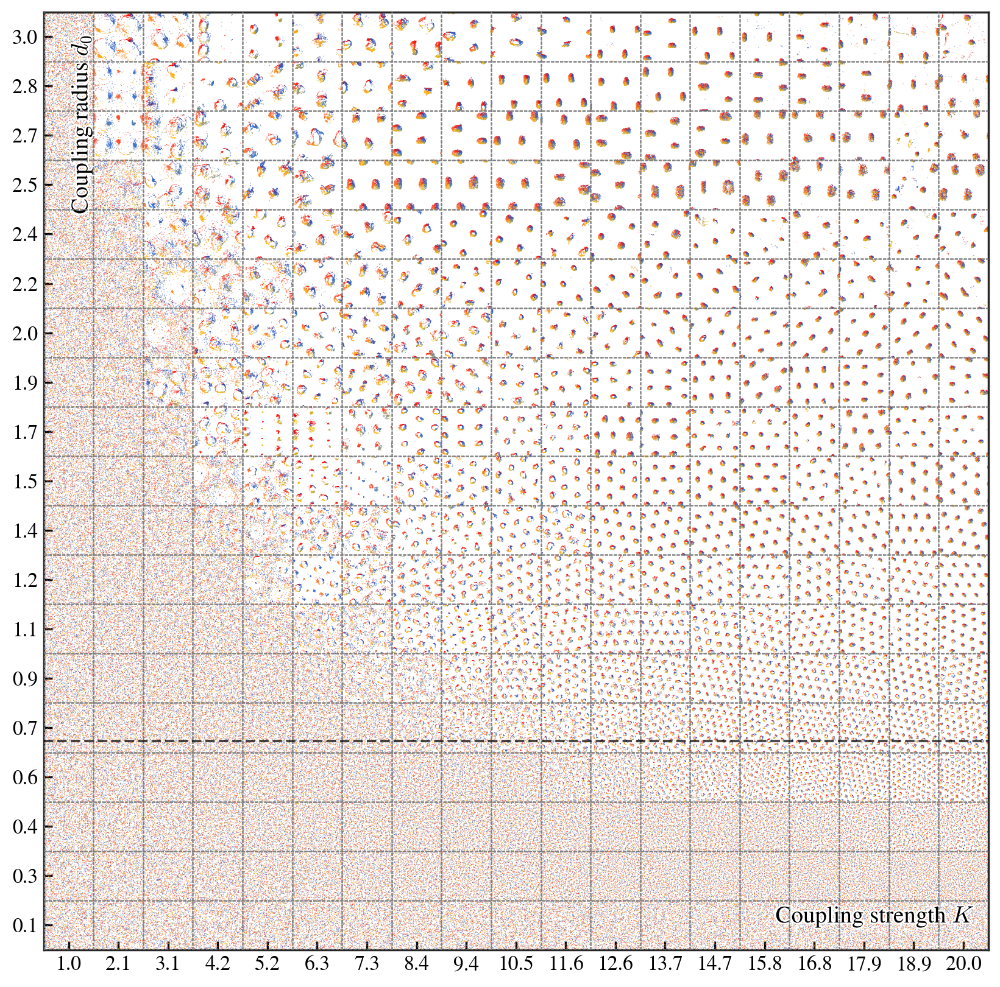

In [64]:
from matplotlib.patheffects import withStroke

colParams = distanceD0s
rowParams = strengthKs
colorsBy = "phase"

# fig, ax = plt.subplots(figsize=(len(rowParams) * 4, len(colParams) * 4))
fig, ax = plt.subplots(figsize=(10, 10))

for i, sa in enumerate(sas):
    if sa is None:
        continue
    row = i // len(rowParams)
    col = i % len(rowParams)
    
    positionShift = np.array([row, col]) * sa.model.boundaryLength
    positionX, phaseTheta = sa.get_state(-1)
    positionX = positionX + positionShift
    if colorsBy == "freq":
        colors = (
            ["red"] * (sa.model.freqOmega >= 0).sum() + 
            ["#414CC7"] * (sa.model.freqOmega < 0).sum()
        )
    elif colorsBy == "phase":
        colors = [cmap(i) for i in
            np.floor(256 - phaseTheta / (2 * np.pi) * 256).astype(np.int32)
        ]

    ax.quiver(
        positionX[:, 0], positionX[:, 1],
        np.cos(phaseTheta), np.sin(phaseTheta), 
        color=colors,
        # scale=300, width=0.0004 / len(rowParams) * 7
        scale_units='inches', scale=100.0, width=0.002 / (len(rowParams) * 5) * 10
    )
    ax.axhline(
        y=col * sa.model.boundaryLength, 
        color="gray", linewidth=0.5, linestyle="--", alpha=0.3, zorder=100
    )
    ax.axvline(
        x=row * sa.model.boundaryLength, 
        color="gray", linewidth=0.5, linestyle="--", alpha=0.3, zorder=100
    )

boundaryLength = models[0].boundaryLength
plt.xlim(0, len(rowParams) * boundaryLength)
plt.ylim(0, len(colParams) * boundaryLength)
plt.xticks(
    np.arange(0, len(rowParams) * boundaryLength, boundaryLength) + boundaryLength / 2,
    [f"{k:.1f}" for k in rowParams]
)
plt.yticks(
    np.arange(0, len(colParams) * boundaryLength, boundaryLength) + boundaryLength / 2,
    [f"{d:.1f}" for d in colParams]
)

text1 = plt.text(len(rowParams) * boundaryLength * 0.88, len(rowParams) * boundaryLength * 0.035,
                 "Coupling strength $K$", # weight="bold",
                 fontsize=14, ha="center", va="center")
text2 = plt.text(len(rowParams) * boundaryLength * 0.04, len(rowParams) * boundaryLength * 0.88,
                 "Coupling radius $d_0$", # weight="bold",
                 fontsize=14, ha="center", va="center", rotation=90)
for text in [text1, text2]:
    text.set_path_effects([withStroke(linewidth=2, foreground='white')])
plt.tick_params(length=5, direction="in")

criticalD0 = opMap[strengthKs[-1]][opMap[strengthKs[-1]] < maxKNorm].index[0]
d0Delta = distanceD0s[1] - distanceD0s[0]
adjCriticalD0 = (criticalD0 / d0Delta + 0.5) * boundaryLength
plt.axhline(y=adjCriticalD0, color="black", linestyle="--", linewidth=1.5, alpha=0.7, zorder=100)

plt.savefig(
    f"figs/{sa.model.__class__.__name__}_"
    f"varying_strengthK_and_distanceD0_{colorsBy}_"
    f"a{phaseLags[0]:.2f}_Do{deltaOmegas[0]}"
    f"{'initPhaseTheta,' if sa.model.initPhaseTheta is not None else ''}"
    f"_aN{sa.model.agentsNum}_dist{sa.model.freqDist}.png", 
    bbox_inches="tight", dpi=300
)

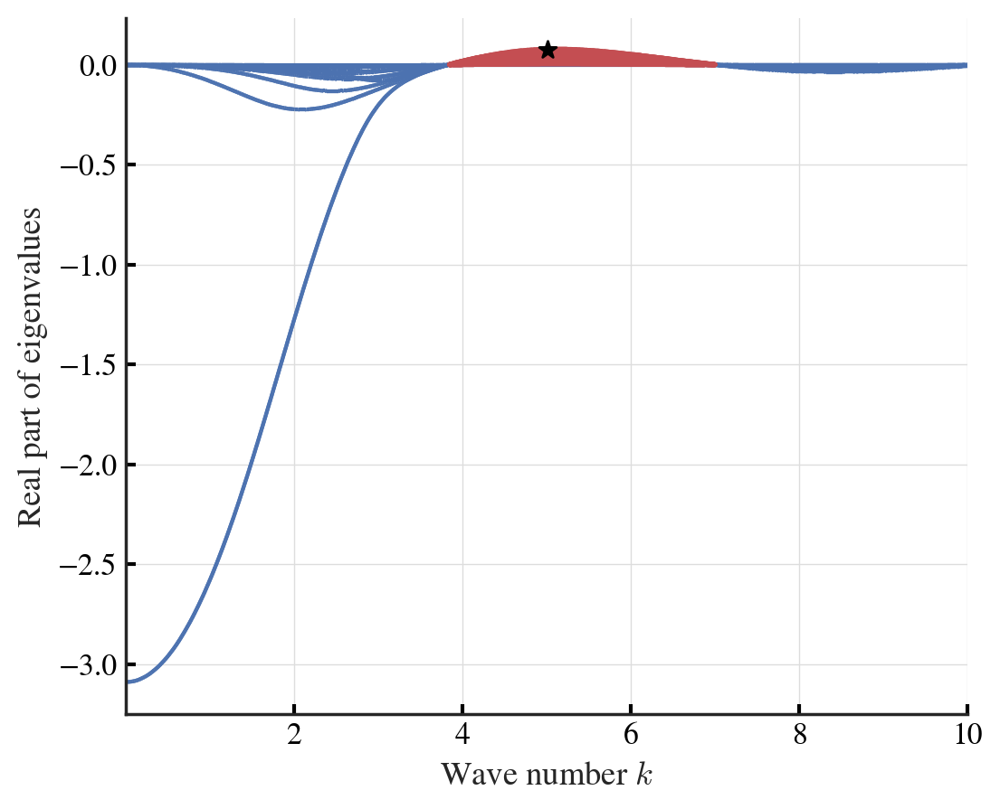

In [16]:
import numpy as np
from scipy.special import j1
from scipy.linalg import eig
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from matplotlib.collections import LineCollection

def compute_eigenvalues_for_k(k: float, params: dict, M: int = 10):
    """
    params: dict:
        - v: speedV
        - K: coupling strength
        - d0: coupling radius
        - alpha: phase frustration
    M: truncated basis size (m from -M to M)
    """
    v = params['v']
    K = params['K']
    d0 = params['d0']
    alpha = params['alpha']
    
    m_values = np.arange(-M, M+1)
    dim = len(m_values)
    
    L0 = np.zeros((dim, dim), dtype=complex)
    besselTerm = K * j1(k*d0) / (k*d0)
    for i, m in enumerate(m_values):
        if m == 1 or m == -1:
            L0[i,i] = besselTerm * np.exp(-m * alpha * 1j)
    
    L1 = np.zeros((dim, dim), dtype=complex)
    for i in range(1, dim):
        L1[i-1, i] = 0.5  # upper line
        L1[i, i-1] = 0.5  # lower line
    
    H = L0 - 1j * v * k * L1
    eigenvalues = eig(H)[0]
    
    # sort with Real part
    return eigenvalues[np.argsort(eigenvalues.real)].round(3)

def plot_continuous_spectrum(kValues: np.ndarray, params: dict, M: int = 10):
    allEvals = []
    for k in kValues:
        evals = compute_eigenvalues_for_k(k, params, M)
        allEvals.append(evals)
    
    allEvals = np.array(allEvals)  # allEvals.shape == (len(kValues), 2M+1)
    
    # create segments set for eval curves
    segments = []
    for i in range(allEvals.shape[1]):
        points = np.array([kValues, allEvals[:,i].real]).T.reshape(-1,1,2)
        # points.shape == (len(kValues), 1, 2), (1, 2) ~  a point in k-eval Fig
        segments.append(np.concatenate([points[:-1], points[1:]], axis=1))
        # segments.shape == (len(kValues), 2, 2)
        # (2, 2) ~ 2 adjacent points in k-eval Fig
    
    segments = np.concatenate(segments, axis=0)
    
    # plt.figure(figsize=(12, 8))

    lc = LineCollection(segments, cmap='viridis', norm=plt.Normalize(-0.1, 0.1))
    plt.gca().add_collection(lc)

    plt.xlim(kValues.min(), kValues.max())
    # plt.ylim(-0.04, 0.01)
    plt.xlabel(r'Wave number $k$')
    plt.ylabel('Real part of eigenvalues')
    # plt.title('Continuous Eigenvalue Spectrum')
    plt.grid(True)
    
    firstPosK = []

    # mark the positive evals
    for i in range(allEvals.shape[1]):
        realEvals = allEvals[:,i].real
        positiveIdx = np.where(realEvals > 0)[0]
        plt.plot(kValues[positiveIdx], realEvals[positiveIdx], 'r-', lw=2)
        if len(positiveIdx) > 0:
            firstPosK.append(kValues[positiveIdx[0]])
    
    peakK = kValues[np.argmax(allEvals.real.max(axis=1))]
    plt.scatter(peakK, allEvals.real.max(), color='black', 
                s=50, label='Peak K', zorder=5, marker='*')

    # plt.show()

    firstPosK = np.min(firstPosK) if len(firstPosK) > 0 else 0
    
    
    return allEvals, firstPosK

def calc_first_break_K(kValues: np.ndarray, params: dict, M: int = 10):
    allEvals = []
    for k in kValues:
        evals = compute_eigenvalues_for_k(k, params, M)
        allEvals.append(evals)
    
    allEvals = np.array(allEvals)  # allEvals.shape == (len(kValues), 2M+1)
    
    # create segments set for eval curves
    segments = []
    for i in range(allEvals.shape[1]):
        points = np.array([kValues, allEvals[:,i].real]).T.reshape(-1,1,2)
        # points.shape == (len(kValues), 1, 2), (1, 2) ~  a point in k-eval Fig
        segments.append(np.concatenate([points[:-1], points[1:]], axis=1))
        # segments.shape == (len(kValues), 2, 2)
        # (2, 2) ~ 2 adjacent points in k-eval Fig
    
    segments = np.concatenate(segments, axis=0)
    
    firstPosK = []

    # mark the positive evals
    for i in range(allEvals.shape[1]):
        realEvals = allEvals[:,i].real
        positiveIdx = np.where(realEvals > 0)[0]
        if len(positiveIdx) > 0:
            firstPosK.append(kValues[positiveIdx[0]])

    firstPosK = np.min(firstPosK) if len(firstPosK) > 0 else 0
    
    return firstPosK

params = {
    'v': 3,       # speed
    'K': 20,   # coupling strength
    'd0': 1,    # coupling radius
    'alpha': 0.6 * np.pi      # phase frustration
}

kValues = np.linspace(0.0001, 10, 500)

allEvals, firstPosK = plot_continuous_spectrum(kValues, params, M=10)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.tick_params(length=4, direction="in", color="black", width=1.5)
# plt.savefig("figs/continuous_spectrum.pdf", bbox_inches="tight")

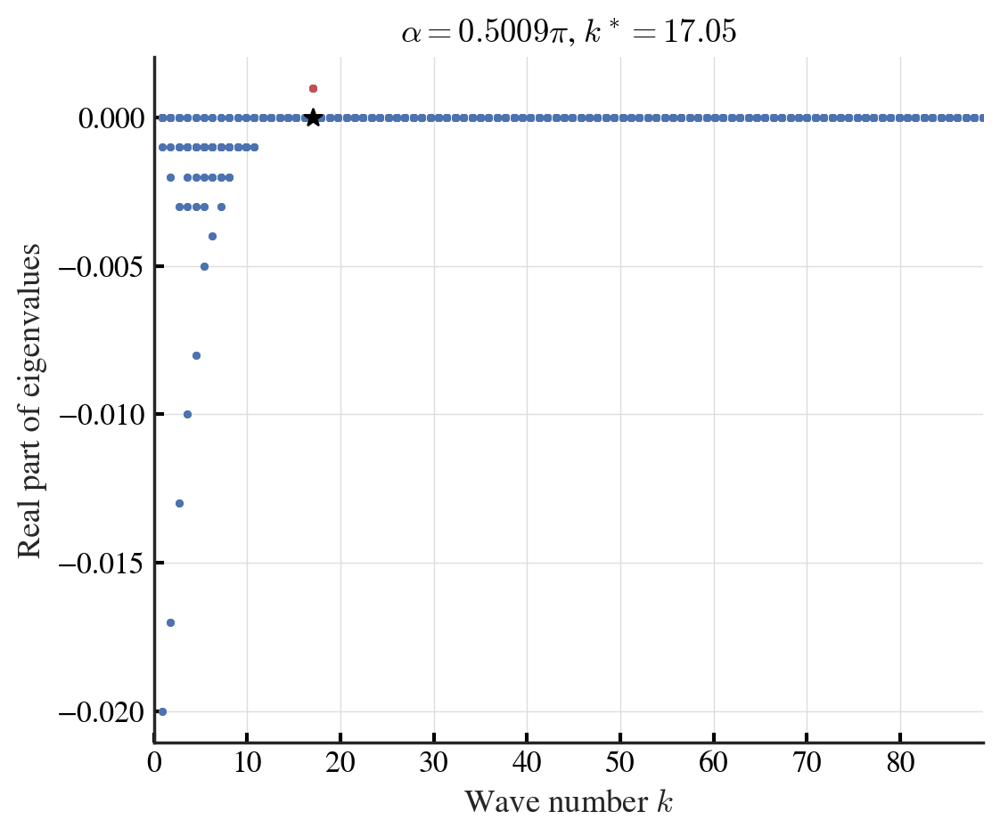

In [65]:
import numpy as np
from scipy.special import j1
from scipy.linalg import eig
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from matplotlib.collections import LineCollection

def compute_eigenvalues_for_k(k: float, params: dict, M: int = 10):
    """
    params: dict:
        - v: speedV
        - K: coupling strength
        - d0: coupling radius
        - alpha: phase frustration
    M: truncated basis size (m from -M to M)
    """
    v = params['v']
    K = params['K']
    d0 = params['d0']
    alpha = params['alpha']
    
    m_values = np.arange(-M, M+1)
    dim = len(m_values)
    
    L0 = np.zeros((dim, dim), dtype=complex)
    besselTerm = K * j1(k*d0) / (k*d0)
    for i, m in enumerate(m_values):
        if m == 1 or m == -1:
            L0[i,i] = besselTerm * np.exp(-m * alpha * 1j)
    
    L1 = np.zeros((dim, dim), dtype=complex)
    for i in range(1, dim):
        L1[i-1, i] = 0.5  # upper line
        L1[i, i-1] = 0.5  # lower line
    
    H = L0 - 1j * v * k * L1
    eigenvalues = eig(H)[0]
    
    # sort with Real part
    return eigenvalues[np.argsort(eigenvalues.real)].round(3)

def plot_continuous_spectrum(kValues: np.ndarray, params: dict, M: int = 10):
    allEvals = []
    for k in kValues:
        evals = compute_eigenvalues_for_k(k, params, M)
        allEvals.append(evals)
    
    allEvals = np.array(allEvals)  # allEvals.shape == (len(kValues), 2M+1)

    for i in range(allEvals.shape[1]):
        plt.scatter(kValues, allEvals[:,i].real, c='b', s=5)

    plt.xlim(kValues.min(), kValues.max())
    # plt.ylim(-0.04, 0.01)
    plt.xlabel(r'Wave number $k$')
    plt.ylabel('Real part of eigenvalues')
    # plt.title('Continuous Eigenvalue Spectrum')
    plt.grid(True)
    
    firstPosK = []

    # mark the positive evals
    for i in range(allEvals.shape[1]):
        realEvals = allEvals[:,i].real
        positiveIdx = np.where(realEvals > 0)[0]
        plt.scatter(kValues[positiveIdx], realEvals[positiveIdx], c='r', s=5)
        if len(positiveIdx) > 0:
            firstPosK.append(kValues[positiveIdx[0]])
    
    # peakK = kValues[np.argmax(allEvals.real.max(axis=1))]
    firstPosK = np.min(firstPosK) if len(firstPosK) > 0 else 0
    plt.scatter(firstPosK, 0, color='black', 
                s=50, label='Peak K', zorder=5, marker='*')

    # plt.show()
    
    return allEvals, firstPosK

def calc_first_break_K(kValues: np.ndarray, params: dict, M: int = 10):
    allEvals = []
    for k in kValues:
        evals = compute_eigenvalues_for_k(k, params, M)
        allEvals.append(evals)
    
    allEvals = np.array(allEvals)  # allEvals.shape == (len(kValues), 2M+1)
    
    # create segments set for eval curves
    segments = []
    for i in range(allEvals.shape[1]):
        points = np.array([kValues, allEvals[:,i].real]).T.reshape(-1,1,2)
        # points.shape == (len(kValues), 1, 2), (1, 2) ~  a point in k-eval Fig
        segments.append(np.concatenate([points[:-1], points[1:]], axis=1))
        # segments.shape == (len(kValues), 2, 2)
        # (2, 2) ~ 2 adjacent points in k-eval Fig
    
    segments = np.concatenate(segments, axis=0)
    
    firstPosK = []

    # mark the positive evals
    for i in range(allEvals.shape[1]):
        realEvals = allEvals[:,i].real
        positiveIdx = np.where(realEvals > 0)[0]
        if len(positiveIdx) > 0:
            firstPosK.append(kValues[positiveIdx[0]])

    firstPosK = np.min(firstPosK) if len(firstPosK) > 0 else 0
    
    return firstPosK

# alphas = np.arange(0.5, 1.1, 0.01) * np.pi
# alphas = np.linspace(0.5, 0.51, 20) * np.pi
# for alpha in alphas:
# Ks = np.linspace(0.1, 20, 10)
# for K in Ks:
d0s = [0.3]  # np.linspace(0.1, 3, 20)
alpha = (0.5 + 0.00092) * np.pi
for d0 in d0s:
    params = {
        'v': 3, 
        'K': 14.72222, 
        'd0': d0,
        'alpha': alpha
    }

    # kValues = np.linspace(0.0001, 10, 500)
    boundaryLength = 7
    kValues = np.arange(1, 100) * 2 * np.pi / boundaryLength

    allEvals, firstPosK = plot_continuous_spectrum(kValues, params, M=10)

    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.tick_params(length=4, direction="in", color="black", width=1.5)
    # plt.savefig("figs/continuous_spectrum.pdf", bbox_inches="tight")
    plt.title(r'$\alpha={:.4f}\pi$, $k^*={:.2f}$'.format(alpha/np.pi, firstPosK))
    plt.xlim(0, kValues.max())
    plt.show()

In [66]:
def calc_break_K(kValues: np.ndarray, params: dict, M: int = 10):
    allEvals = []
    for k in kValues:
        evals = compute_eigenvalues_for_k(k, params, M)
        allEvals.append(evals)
    
    allEvals = np.array(allEvals)  # allEvals.shape == (len(kValues), 2M+1)
    
    # create segments set for eval curves
    segments = []
    for i in range(allEvals.shape[1]):
        points = np.array([kValues, allEvals[:,i].real]).T.reshape(-1,1,2)
        # points.shape == (len(kValues), 1, 2), (1, 2) ~  a point in k-eval Fig
        segments.append(np.concatenate([points[:-1], points[1:]], axis=1))
        # segments.shape == (len(kValues), 2, 2)
        # (2, 2) ~ 2 adjacent points in k-eval Fig
    
    segments = np.concatenate(segments, axis=0)
    
    posK = []
    posEvals = []

    # mark the positive evals
    for i in range(allEvals.shape[1]):
        realEvals = allEvals[:,i].real
        positiveIdx = np.where(realEvals > 0)[0]
        if len(positiveIdx) > 0:
            posK.append(kValues[positiveIdx[0]])
            posEvals.append(realEvals[positiveIdx[0]])

    return np.unique(posK), np.array(posEvals)

def get_first_break_k(params, strictSingle: bool = True):
    alphaPluss = np.arange(0, 0.01, 0.0001)
    firstBreakK = np.nan
    for alphaPlus in alphaPluss:
        params["alpha"] = 0.5 * np.pi + alphaPlus

        boundaryLength = 7
        kValues = np.arange(1, 100) * 2 * np.pi / boundaryLength

        posK, posEvals = calc_break_K(kValues, params, M=10)
        if len(posK) == 1:
            firstBreakK = posK[0]
            break
        if len(posK) > 1:
            if strictSingle:
                assert False, "More than one positive k* found"
            firstBreakK = posK[np.argmax(posEvals.real)]

    return firstBreakK

In [67]:
strengthKs = np.linspace(1, 20, 19)
distanceD0s = np.linspace(0.1, 3, 19)  
selectD0s = distanceD0s[:]#[(0.6 < distanceD0s)]
selectKs = strengthKs[:]#[14 < strengthKs]
firstBreakKs = dict()
for K, d0 in tqdm(product(selectKs, selectD0s), total=len(selectKs) * len(selectD0s)):
    params = {
        'v': 3,
        'K': K,
        'd0': d0,
    }
    firstBreakK = get_first_break_k(params, strictSingle=False)
    firstBreakKs[(K, d0)] = firstBreakK

  0%|          | 0/361 [00:00<?, ?it/s]

In [109]:
kDf = pd.Series(firstBreakKs).reset_index()
kDf.columns = ['K', 'd0', 'firstBreakK']
kDf = kDf.pivot(index='K', columns='d0', values='firstBreakK')
kDf = kDf.loc[4:]  # K
kDf = kDf[kDf.columns[(0.5 < kDf.columns)]]  # d0

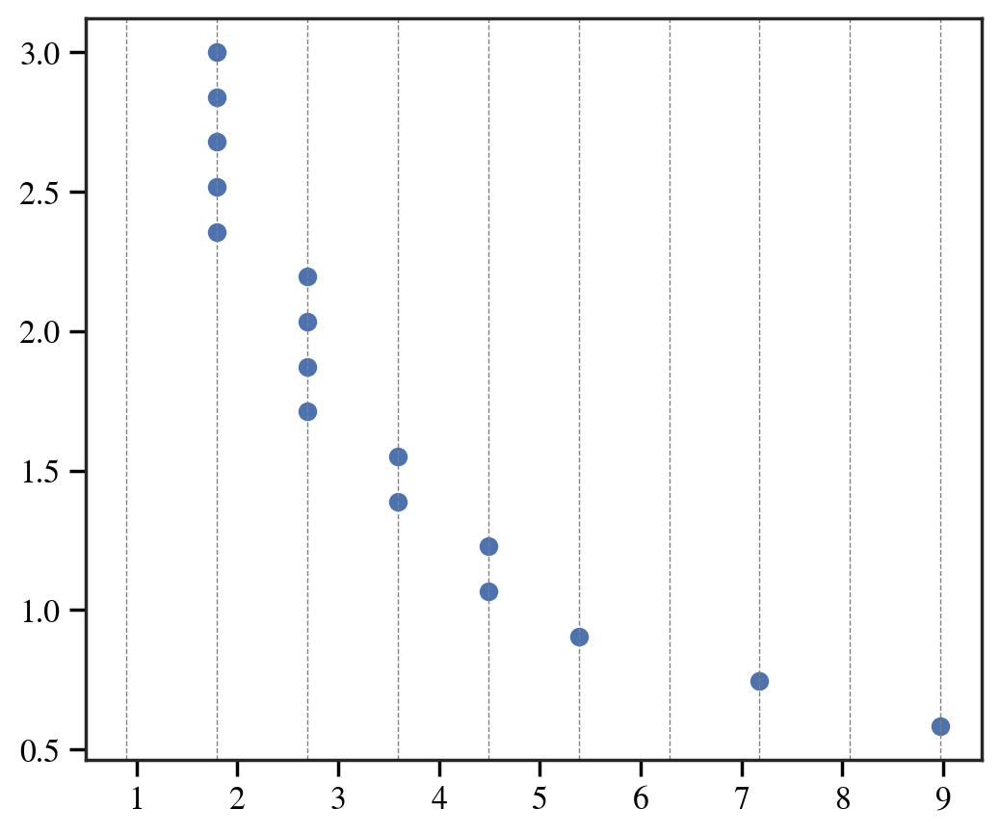

In [119]:
critical = kDf.iloc[-1]
plt.scatter(critical.values, critical.index)
boundaryLength = 7
kValues = np.arange(1, 11) * 2 * np.pi / boundaryLength
for k in kValues:
    plt.axvline(k, color='gray', linestyle='--', linewidth=0.5)

Text(0, 0.5, 'Coupling radius $d_0$')

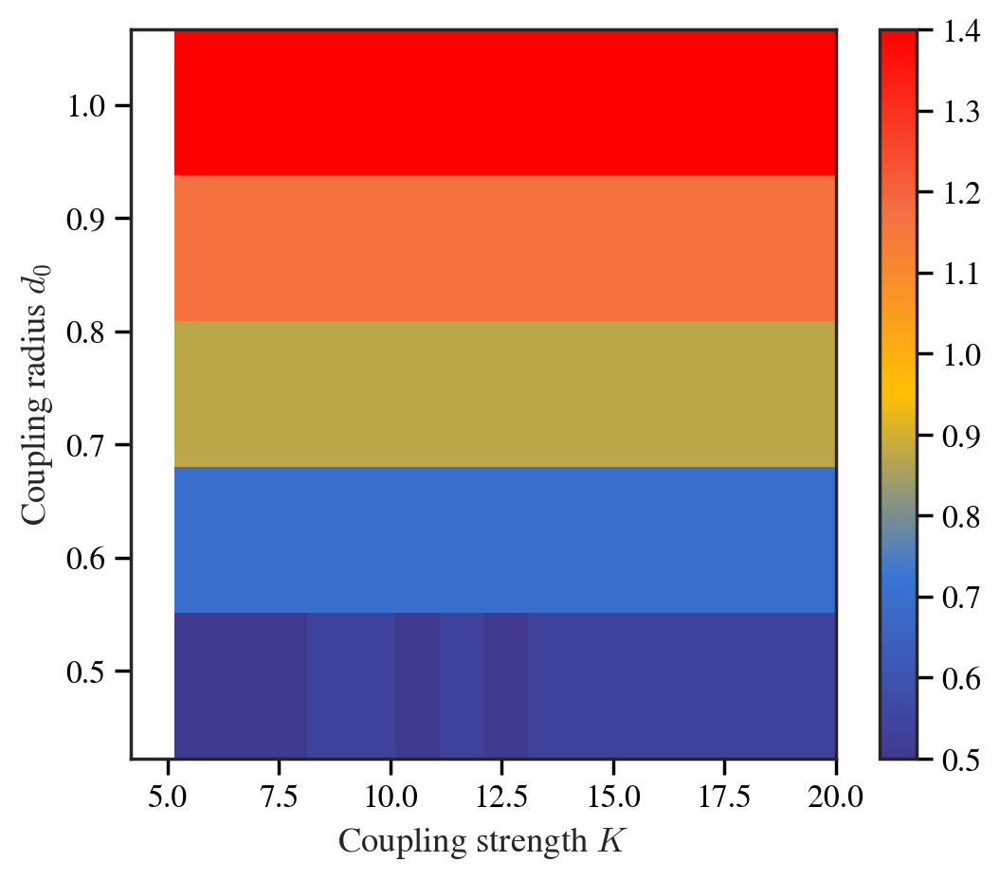

In [103]:
plt.imshow(2 * np.pi / kDf.values.T, cmap=cmap, aspect='auto',
           extent=[kDf.index.min(), kDf.index.max(), kDf.columns.min(), kDf.columns.max()],
           origin='lower')
plt.colorbar()
plt.xlabel('Coupling strength $K$')
plt.ylabel('Coupling radius $d_0$')